# Part 1: Loading and pre-processing dataset

Loading the calendar csv file:

In [2]:
import pandas as pd
import numpy as np

df_cal = pd.read_csv('calendar_dec18.csv')
df_cal.head(2)

,listing_id,date,available,price
0,14250,2019-12-06,t,$470.00
1,12351,2019-08-17,t,$110.00


Loading the listing summary dataset:

In [3]:
df = pd.read_csv('listings_summary_dec18.csv')
df.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321


In [4]:
filter_col = ['id', 'name', 'neighbourhood', 'latitude', 
              'longitude', 'room_type', 'price', 'reviews_per_month', 'availability_365']
df = df[filter_col]
df.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365
0,12351,Sydney City & Harbour at the door,Sydney,-33.865153,151.191896,Private room,100,4.83,187
1,14250,Manly Harbour House,Manly,-33.800929,151.261722,Entire home/apt,471,0.03,321


In [5]:
print(df.shape)
print('Number of neighborhoods in the city of Sydney:', df['neighbourhood'].nunique())
print('Number of unique listing ids as of December 2018 in the city of Sydney:', df['id'].nunique())

(36662, 9)
Number of neighborhoods in the city of Sydney: 38
Number of unique listing ids as of December 2018 in the city of Sydney: 36662


### Replacing missing values and filtering out outliers and 

#### Cleaning the calendar dataset:

In [6]:
df_cal.dtypes

listing_id     int64
date          object
available     object
price         object
dtype: object

Notice that date is of type object, which should be converted to datetime. Besides, price information is displayed with a currency symbol and is treated as strings. Some values also have a comma between the numbers. So we need to remove all these special characters and then convert the price to type float. 

In [7]:
df_cal.date = pd.to_datetime(df_cal.date)

In [8]:
df_cal.price = df_cal.price.str.replace('$', '')
df_cal.price = df_cal.price.str.replace(',', '')
df_cal.price = df_cal.price.astype(float)

In [9]:
print(df_cal.date.min(), df_cal.date.max())

2018-12-07 00:00:00 2019-12-06 00:00:00


All the listings fall the in perioud between Dec. 2018 and Dec. 2019, exactly a one-year period.

#### Cleaning the listing summary dataset:

In [10]:
df.describe()

,id,latitude,longitude,price,reviews_per_month,availability_365
count,3.666200e+04,36662.000000,36662.000000,36662.000000,24725.000000,36662.000000
mean,1.852083e+07,-33.863112,151.204259,207.689597,1.139057,97.387595
std,8.473884e+06,0.071501,0.083529,323.818795,1.536521,122.969054
min,1.235100e+04,-34.135212,150.642903,0.000000,0.010000,0.000000
25%,1.170461e+07,-33.898444,151.179678,80.000000,0.140000,0.000000
50%,2.027350e+07,-33.882486,151.215923,136.000000,0.490000,36.000000
75%,2.524405e+07,-33.832072,151.261413,223.000000,1.520000,165.000000
max,3.059387e+07,-33.389728,151.339811,14999.000000,15.180000,365.000000


This table reveals that for some listings, information for monthly reviews is missing. This is as expected as some listings, for various reasons, may not have attracted any tenants or tenants who give reviews. Thus, we can simply replace the missing values for monthly reviews with 0. 

In [11]:
# replace missing values with 0 
df['reviews_per_month'].replace(np.nan, 0, inplace=True) 

Let's check the price information to see if there is any outliers

In [12]:
df.sort_values('price').head()

,id,name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365
18682,20563580,Elements of style,Rockdale,-33.961377,151.138597,Private room,0,0.31,0
17385,19445144,悉尼北区-独立水景Studio!,Manly,-33.802398,151.254954,Private room,0,0.08,0
16281,18367523,"warm and sweet,friendly and clean",Rockdale,-33.955299,151.138935,Shared room,0,0.00,365
28144,25960573,3 60 Ewart Lane Dulwich Hill,Marrickville,-33.910858,151.139156,Entire home/apt,0,0.58,68
18752,20624531,Master Bedroom in Modern Apartment North Shore,Ku-Ring-Gai,-33.733476,151.124139,Private room,0,0.00,323


I noticed that there are some listings whose prices are zero, which is definitely unrealistic, so I decided to remove these listings from the original dataset, before I carry out any further analysis. 

In [13]:
# remove listings priced at 0 dollar per night 
df_filtered = df[df['price'] != 0]

In [14]:
df_filtered.sort_values('price', ascending=False).head()

,id,name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365
28949,26721893,Exclusive use of the Little Albion Guest House...,Sydney,-33.881904,151.211368,Entire home/apt,14999,0.0,24
13879,16293257,Light and breezy resort style home.,Lane Cove,-33.820376,151.177122,Entire home/apt,13000,0.0,0
3145,4903636,Best place eva,Waverley,-33.894720,151.273145,Private room,12000,0.0,87
21089,21785304,Modern & Bright One Bed Apartment in Surry Hills,Sydney,-33.889790,151.212656,Entire home/apt,12000,0.0,89
33590,29865765,Private room with shared bathroom,Sydney,-33.888022,151.194421,Private room,11111,0.0,190


Similarly, I noticed some listings with extremely high prices. Are these prices real or are they outliers as well? Before making a confident decision, I went onto Airbnb's official website and searched the most expensive listings in Sydney and found out that indeed there are a few properties priced at over $10,000 per night. Thus, I can safely say that these prices are practical and there is no need to treat them as outliers. 

# Part 2: Exploratory data analysis

### A. Listing Availability 

The calendar dataset contains information on whether a listing is available or not on any day between Dec 2018 and Dec 2019. Letter t means available and f means not. We can replace t with number 1 and f with number 0 and calculate their respective counts in each month of the one-year period. This will inform us in which months the listings are easily available and what are the busiest months. 

In [15]:
df_cal_new = df_cal[['date', 'available']].copy()
df_cal_new['availability'] = df_cal_new.available.map(lambda x: 0 if x == 'f' else 1)

In [16]:
df_cal_new = df_cal_new.groupby('date')['availability'].mean().reset_index()

/Users/fayong/anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


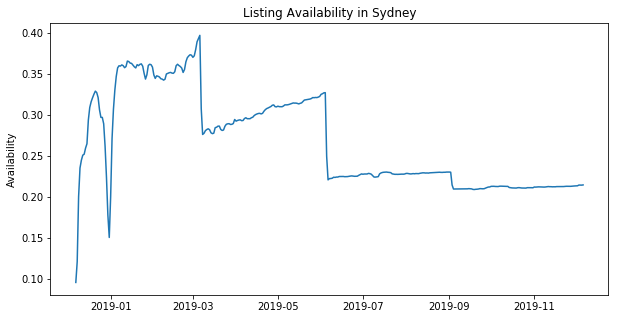

In [17]:
%matplotlib inline 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_cal_new['date'], df_cal_new['availability'])
plt.title('Listing Availability in Sydney')
plt.ylabel('Availability')
plt.show()

This implies that the second half of the year is actually the busiest time for Airbnb hosts, with most listings being booked out. And months from January to March are the easiest time to find a listing, indicating a low tourist season. This is counter-intuitive as Sydney's high season actually falls between Dec. and Feb, because of its location in the Southern hemisphere and tourists flood the city to take advantage of the warm weather here. 

I am guessing although many of the listings are marked as unavailable from June 2019 and onwards, this is not because they have been all booked out. It might be simply for the reason that these dates are too far into the future and the listings are not open for booking yet. Remember for our dataset the starting date is Dec. 7 2018. 

### B. Plotting number of listings and average price of listings in each neighborhood

In [18]:
listing_count = df_filtered.groupby('neighbourhood')[['id']].count()#.sort_values(by='id',ascending=False)   
listing_count.sort_values('id', ascending = False).head(5)

,id
neighbourhood,
Sydney,9238
Waverley,5466
Randwick,3346
Manly,1799
Warringah,1794


The majority of the listings are concentrated in **Sydeny, Waverley, Rankwick, Manly, and Warringah**. 

In [19]:
price = df_filtered.groupby('neighbourhood')[['price']].mean()#.sort_values(ascending=False)
price.sort_values('price', ascending = False).head()

,price
neighbourhood,
Pittwater,496.598154
Mosman,383.271536
Lane Cove,300.107266
Woollahra,298.792753
Manly,280.221790


The most expensive listings are concentrated in **Pittwater, Mosman, Lane Cove, Woollahra, and Manly**. 

In [20]:
df_merged = pd.merge(listing_count, price, on='neighbourhood')
df_merged.rename(columns = {'id':'number of listings', 'price':'average price'}, inplace=True)

In [21]:
df_merged.reset_index(inplace=True)
df_merged.head()

,neighbourhood,number of listings,average price
0,Ashfield,306,140.281046
1,Auburn,469,143.456290
2,Bankstown,180,93.844444
3,Blacktown,237,84.223629
4,Botany Bay,600,118.245000


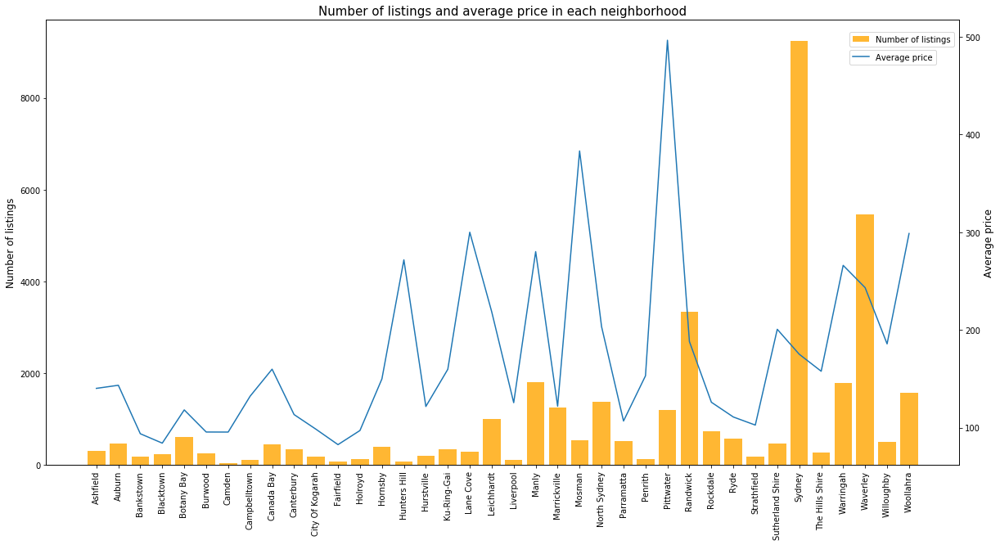

In [22]:


# Let's build our plot
plt.rcParams['figure.figsize']=(20,10) # set the figure size 
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()  # set up the 2nd axis

ax1.bar(df_merged.index, df_merged['number of listings'], alpha = 0.8, color='orange')   #plot average price on axis #1
ax2.plot(df_merged['average price']) 

ax2.grid(b=False) # turn off grid #2
 
ax1.set_title('Number of listings and average price in each neighborhood', fontsize=15)
ax1.set_ylabel('Number of listings', fontsize=12)
ax2.set_ylabel('Average price', fontsize=12)

# Set the x-axis labels to be more meaningful than just some random dates.
labels = tuple(df_merged.neighbourhood)
ax1.axes.set_xticks(range(38))
ax1.axes.set_xticklabels(labels, rotation=90);
ax1.legend(['Number of listings'], loc=(0.88,0.94));
ax2.legend(['Average price'], loc=(0.88,0.9));

We can also make use of the geojson file contained in our dataset to visualize the above information, which is more straighforward and more visually appealing. First we create a choropleth graph showing the density of listings in each neighborhood. Then we do the same for average price in each neighborhood. Note that since the geojson file is a bit too large, the outputs cannot be rendered in jupyter notebook, so it is necessary to save the outputs to HTML files and then open them directly in a browser such as Chrome. 

#### Number of listings

In [23]:
import folium 
import numpy as np

threshold_scale = np.linspace(df_merged['number of listings'].min(),
                              df_merged['number of listings'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 
# make sure that the last value of the list is greater than the maximum number of listings

# lat and lng of Sydney
lat = -33.8688
lng = 151.2093
syd_geo = r'neighbourhoods.geojson'
syd_nb_map = folium.Map(location=[lat, lng],zoom_start = 10)

syd_nb_map.choropleth(
    geo_data=syd_geo,
    data=df_merged,
    columns=['neighbourhood', 'number of listings'],
    key_on='feature.properties.neighbourhood',      
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Density of listings in each neighborhood',
    reset=True
)

# display map
syd_nb_map


#### Average price

In [24]:
threshold_scale = np.linspace(df_merged['average price'].min(),
                              df_merged['average price'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 
# make sure that the last value of the list is greater than the maximum number of listings

# lat and lng of Sydney
lat = -33.8688
lng = 151.2093
syd_geo = r'neighbourhoods.geojson'
syd_nb_map_price = folium.Map(location=[lat, lng],zoom_start = 10)

syd_nb_map_price.choropleth(
    geo_data=syd_geo,
    data=df_merged,
    columns=['neighbourhood', 'average price'],
    key_on='feature.properties.neighbourhood',      
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Price level in each neighborhood',
    reset=True
)

# display map
syd_nb_map_price


In [25]:
syd_nb_map.save('map of neighbourhood listings.html')

syd_nb_map_price.save('map of neighbourhood price.html')

### C. Preliminary clustering based on price, reviews, and room type

In [26]:
df_cluster = df_filtered.reset_index(drop=True).drop(['id', 'neighbourhood','latitude', 'longitude',
                                              'availability_365'], axis=1)
df_cluster.head(2)

,name,room_type,price,reviews_per_month
0,Sydney City & Harbour at the door,Private room,100,4.83
1,Manly Harbour House,Entire home/apt,471,0.03


Now let's normalize the dataset. But why do we need normalization in the first place? Normalization is a statistical method that helps mathematical-based algorithms interpret features with different magnitudes and distributions equally. We use **StandardScaler()** to normalize our dataset.

In [28]:
from sklearn.preprocessing import StandardScaler

cluster_dataset = StandardScaler().fit_transform(df_cluster.iloc[:,2:])
df_norm = pd.DataFrame(cluster_dataset, columns=['price', 'reviews_per_month'])    # normalized dataset 
df_norm.insert(0, 'name', df_cluster['name'])
df_norm.head()

/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


,name,price,reviews_per_month
0,Sydney City & Harbour at the door,-0.332699,2.966394
1,Manly Harbour House,0.812936,-0.538931
2,Stunning Penthouse Apartment In Heart Of The City,-0.304908,2.090063
3,3 BED HOUSE + 1 BED STUDIO Balmain,0.748089,-0.429389
4,"COZY PRIVATE ROOM, GREAT LOCATION!",-0.450042,-0.232215


There are three different room types, so we can use one hot encoding to transform the room type into numerical values.

In [29]:
# one hot encoding
df_syd_onehot = pd.get_dummies(df_cluster[['room_type']], prefix="", prefix_sep="")
#df_syd_onehot.head()

In [30]:
df_cluster_2 = df_norm.join(df_syd_onehot).set_index('name')
df_cluster_2.head(2)

,price,reviews_per_month,Entire home/apt,Private room,Shared room
name,,,,,
Sydney City & Harbour at the door,-0.332699,2.966394,0,1,0
Manly Harbour House,0.812936,-0.538931,1,0,0


Now let's cluster these listings using k-means:

In [31]:
from sklearn.cluster import KMeans

num_clusters = 4

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
k_means.fit(df_cluster_2)
labels = k_means.labels_

#print(labels)

df_cluster_2['Cluster'] = labels
df_cluster_2.head(2)

,price,reviews_per_month,Entire home/apt,Private room,Shared room,Cluster
name,,,,,,
Sydney City & Harbour at the door,-0.332699,2.966394,0,1,0,2
Manly Harbour House,0.812936,-0.538931,1,0,0,1


We can easily check the centroid values by averaging the features in each cluster, and the number of listings in each cluster.

In [32]:
df_cluster_2.groupby('Cluster').mean()

,price,reviews_per_month,Entire home/apt,Private room,Shared room
Cluster,,,,,
0,-0.384511,-0.284714,0.000000,0.953606,0.046394
1,0.198939,-0.295809,0.997863,0.001323,0.000814
2,-0.154096,2.396034,0.784388,0.211345,0.004267
3,8.787724,-0.426484,0.930108,0.069892,0.000000


The <em>k</em>-means method has partitioned the listings into four different groups. By examining these groups, we can realize some common charateristics. For example, the 4 clusters can be:

- a mix of private rooms and shared rooms, most affordable price, but also not many reviews from tenants
- mostly entire home/apt, price between affordable and expensive, but do not have many reviews
- a mix of entire home/apt and private room, affordable price, and with most reviews
- also a mix of entire home/apt and private room, extremely expensive, and with the least number of reviews

### D. Mapping the top and bottom 200 listings by price in the entire Sydney region

In [34]:
df_price_top = df_filtered.sort_values('price', ascending = False).iloc[:200, :]
df_price_bottom = df_filtered.sort_values('price').iloc[:200, :]

df_price_top.reset_index(inplace=True, drop=True)
df_price_bottom.reset_index(inplace=True, drop=True)

df_price_top.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365
0,26721893,Exclusive use of the Little Albion Guest House...,Sydney,-33.881904,151.211368,Entire home/apt,14999,0.0,24
1,16293257,Light and breezy resort style home.,Lane Cove,-33.820376,151.177122,Entire home/apt,13000,0.0,0


#### Now we have a dataset that's been filtered and can better support our analysis. 

In [35]:
from geopy.geocoders import Nominatim

address = 'Sydney, NSW'

geolocator = Nominatim(user_agent="syd_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Sydney are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Sydney are -33.8548157, 151.2164539.


In [36]:
import folium # map rendering library

# create map of Sydney using latitude and longitude values
map_syd = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
# expensive listings are shown in blue whereas cheap listings are shown in red 
for lat, lng, label in zip(df_price_top['latitude'], df_price_top['longitude'], df_price_top['name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_syd)  
    
for lat, lng, label in zip(df_price_bottom['latitude'], df_price_bottom['longitude'], df_price_bottom['name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_syd)  
    
map_syd

This map clearly shows that listings on the high end of the price spectrum are generally located close to the coastlines, especially in the north-eastern tip of the Sydney region, as well as in the eastern suburbs, ranging across most of the regions north of Coogee. The cheapest listings, on the other hand, are scattered across mainly the western and southern parts of the city, with some exceptions near the Bondi Junction area. 

The results are intuitive, since being close to the coastline means much better scenery, and this can definitely push up property prices. This also coincides with the fact that properties in these areas are much more expensive than areas in the rest of the city. 

One thing that's beyond our expectation is that we see quite a few cheap listings close to the Sydney CBD area, in suburbs like Chippendale and Ultimo. I am guessing these are probably shared rooms. Let's take a closer look at these listings to see if my intuition is true. 

In [37]:
df_price_bottom[df_price_bottom['neighbourhood'] == 'Sydney'].groupby('room_type').count()

,id,name,neighbourhood,latitude,longitude,price,reviews_per_month,availability_365
room_type,,,,,,,,
Entire home/apt,2,2,2,2,2,2,2,2
Private room,4,4,4,4,4,4,4,4
Shared room,33,33,33,33,33,33,33,33


This indicates that among the 39 cheapest listings in the Sydney CBD area, 33 of them are shared rooms, which **confirms** my initial prediction. 

## Part 3: Clustering listings in Sydney CBD using Foursquare

In [38]:
CLIENT_ID = 'DPNNZEDGIAFE3RQAUSL0BV1YTLQFG3VGUFKD45HQAU3M0BJX' # your Foursquare ID
CLIENT_SECRET = 'BU5ZOGKYNLV1ESWZGXMTU2DWC5QCM4DOZN3CTCPOXDCVECLY' # your Foursquare Secret
VERSION = '20181231' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: DPNNZEDGIAFE3RQAUSL0BV1YTLQFG3VGUFKD45HQAU3M0BJX
CLIENT_SECRET:BU5ZOGKYNLV1ESWZGXMTU2DWC5QCM4DOZN3CTCPOXDCVECLY


Our original dataset contains more than 36k listings, so obviously this is not practical to explore using API from Foursquare. It will take a tremendous amount of time to return nearby venues for so many listings. Thus, to make the analysis more feasible, I decide to apply some filters to limit listings to only those that meet specific criteria. Here, the criteria I am using include being located in the neighborhood of Sydney and having at least 6 monthly reviews. After applying the filters, I am left with a dataset that contains only 252 listings, which is much more practical for conducting further analysis. 

In [40]:
print(df_filtered.shape)
df_syd = df_filtered[(df_filtered['neighbourhood'] == 'Sydney') & (df_filtered['reviews_per_month'] >= 6)]
print(df_syd.shape)

df_syd.groupby('room_type').count()

(36653, 9)
(252, 9)


,id,name,neighbourhood,latitude,longitude,price,reviews_per_month,availability_365
room_type,,,,,,,,
Entire home/apt,190,190,190,190,190,190,190,190
Private room,62,62,62,62,62,62,62,62


Now, let's get the top 30 venues that are within a radius of 400 meters of these listings:

In [41]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

def getNearbyVenues(names, latitudes, longitudes, radius=400, LIMIT=30):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        
        except:
            continue 
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    
    # return a list first, then transform the entire list to a dataframe. 
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Listing Name', 
                  'Listing Latitude', 
                  'Listing Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    
    return(nearby_venues)

In [42]:
syd_venues = getNearbyVenues(names=df_syd['name'],
                                   latitudes=df_syd['latitude'],
                                   longitudes=df_syd['longitude']
                                  )

In [44]:
syd_venues.groupby('Listing Name').count().head(2)

,Listing Latitude,Listing Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Listing Name,,,,,,
"""Brand New"" 3 Bedroom apartment at 'PIER 99'",30,30,30,30,30,30
"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",30,30,30,30,30,30


We can see that for most listings, Foursquare has returns the maximun number of venues, i.e. 30. This is expected as these listings are located in the most central area of the city, so there must be various types of venues nearby. 

### Clustering based on price and nearby venues

In [46]:
# one hot encoding
syd_onehot = pd.get_dummies(syd_venues[['Venue Category']], prefix="", prefix_sep="")

# add listing column back to dataframe
syd_onehot['Listing Name'] = syd_venues['Listing Name'] 

# move neighborhood column to the first column
fixed_columns = [syd_onehot.columns[-1]] + list(syd_onehot.columns[:-1])
syd_onehot = syd_onehot[fixed_columns]

syd_grouped = syd_onehot.groupby('Listing Name').mean().reset_index()
syd_grouped.head(2)

,Listing Name,American Restaurant,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Australian Restaurant,...,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Water Park,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
0,"""Brand New"" 3 Bedroom apartment at 'PIER 99'",0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0


Let's add the price information back to the syd_grouped_2 dataset, so that we can cluster the listings based on both price and surrounding venues. 

In [47]:
df_syd_2 = df_syd[['name','price']].sort_values('name').reset_index(drop=True)
df_syd_2.head(2)

,name,price
0,"""Brand New"" 3 Bedroom apartment at 'PIER 99'",282
1,"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",118


In [48]:
syd_norm = StandardScaler().fit_transform(df_syd_2.iloc[:,1:])
df_norm = pd.DataFrame(syd_norm, columns=['price'])    # normalized dataset 

df_norm.insert(0, 'name', df_syd_2['name'])

/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [49]:
df_norm.rename(columns = {'name':'Listing Name','price':'Price'}, inplace=True)

In [50]:
df_syd_cluster= df_norm.join(syd_grouped.set_index('Listing Name'), on='Listing Name')
df_syd_cluster.head(2)

,Listing Name,Price,American Restaurant,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Water Park,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
0,"""Brand New"" 3 Bedroom apartment at 'PIER 99'",1.278086,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",-0.521721,0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0


Let's define a function to return the top 5 most common venues types near the listings we are investigating

In [51]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[2:]  # changed to 2 to ignore the price column
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [52]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Listing Name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
listing_venues_sorted = pd.DataFrame(columns=columns)
listing_venues_sorted['Listing Name'] = df_syd_cluster['Listing Name']

for ind in np.arange(df_syd_cluster.shape[0]):
    listing_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df_syd_cluster.iloc[ind, :], num_top_venues)

listing_venues_sorted.head()

,Listing Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,"""Brand New"" 3 Bedroom apartment at 'PIER 99'",Seafood Restaurant,Café,Fish Market,Pub,Sushi Restaurant
1,"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",Italian Restaurant,Café,Bar,Cocktail Bar,Burger Joint
2,$25 | 5mins Central St | Hike Bondi to Coogee,Café,Bar,Art Gallery,Hotel,Yoga Studio
3,"+++ LUX WAREHOUSE IN BEST LOCATION, AS SEEN ON...",Café,Bar,Art Gallery,Pub,Yoga Studio
4,1 Studio in the heart of Sydney- Darlinghurst CBD,Italian Restaurant,Bar,Japanese Restaurant,Burger Joint,American Restaurant


Here, I am trying to separate the listings into 3 distinct categories based on their price level, and types of surrouding venues.

In [54]:
# set number of clusters
kclusters = 3

syd_grouped_clustering = df_syd_cluster.drop('Listing Name', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(syd_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_; 

Having obtained the cluster label, we can insert this information back to the listings_venues_sorted dataset.

In [55]:
listing_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Next, we combine the dataset containing the cluster labels with our original dataset which has information on latitude, longitude, room type, etc.

In [56]:
df_syd_merged = pd.concat([df_syd.sort_values('name').reset_index(drop=True
                                                                 ).drop(['id','availability_365'],1
                                                                       ),listing_venues_sorted.drop('Listing Name',1)], axis =1)
df_syd_merged.head(2)

,name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,"""Brand New"" 3 Bedroom apartment at 'PIER 99'",Sydney,-33.874177,151.192281,Entire home/apt,282,6.54,1,Seafood Restaurant,Café,Fish Market,Pub,Sushi Restaurant
1,"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",Sydney,-33.880281,151.217151,Entire home/apt,118,6.91,2,Italian Restaurant,Café,Bar,Cocktail Bar,Burger Joint


### Exploring the clusters

In [57]:
cluster_1 = df_syd_merged.loc[df_syd_merged['Cluster Labels'] == 0]
cluster_1.drop(['latitude','longitude','neighbourhood',
                'reviews_per_month', 'Cluster Labels'],1).set_index('name')

,room_type,price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
name,,,,,,,
2 BED WITH FREE PARKING IN CBD,Entire home/apt,235,Thai Restaurant,Chinese Restaurant,Café,Coffee Shop,Hostel
2 BED WITH FREE PARKING IN CBD,Entire home/apt,226,Thai Restaurant,Chinese Restaurant,Café,Coffee Shop,Hostel
"2 BR Home by Fish Market, ICC & Darling Harbour",Entire home/apt,199,Bar,Café,Fish Market,Seafood Restaurant,Hotel
"2 BR Unit 10 Mins CBD, Near Grounds of Alexandria",Entire home/apt,186,Café,Grocery Store,Pub,Thai Restaurant,Pet Store
2 Beds Cozy Apartment in CBD 1mins to QVB,Entire home/apt,192,Coffee Shop,Café,Japanese Restaurant,Hotel,Shopping Mall
2.5BR Apt nr CBD & ICC Private yard(free parking),Entire home/apt,228,Café,Playground,Pub,Fountain,Sandwich Place
2.5BR UNIT free Car Park in SYDNEY CBD,Entire home/apt,255,Thai Restaurant,Hotel,Japanese Restaurant,Hostel,Sandwich Place
2BD Home Located in Beautiful Surry Hills,Entire home/apt,198,Café,Japanese Restaurant,Pizza Place,Coffee Shop,Pub
2BR Divine Suites in Sydney CBD,Entire home/apt,249,Hotel,Café,Italian Restaurant,Cocktail Bar,Scenic Lookout


In [58]:
cluster_2 = df_syd_merged.loc[df_syd_merged['Cluster Labels'] == 1]
cluster_2.drop(['latitude','longitude','neighbourhood',
                'reviews_per_month', 'Cluster Labels'],1).set_index('name')

,room_type,price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
name,,,,,,,
"""Brand New"" 3 Bedroom apartment at 'PIER 99'",Entire home/apt,282,Seafood Restaurant,Café,Fish Market,Pub,Sushi Restaurant
"2BR near Harbour Bridge, Opera House & the Rocks",Entire home/apt,300,Pub,Hotel,Park,Café,Modern European Restaurant
2BR+2BA APT at The Rocks+parkng+ Bridge views+wifi,Entire home/apt,300,Pub,Café,Hotel Bar,Hotel,Brewery
5 Bedroom Terrace house crown st Central station,Entire home/apt,400,Café,Japanese Restaurant,Pizza Place,Breakfast Spot,Cosmetics Shop
Apartment in heart of city Sydney CBD-World Square,Entire home/apt,300,Japanese Restaurant,Coffee Shop,Korean Restaurant,Hotel,Chinese Restaurant
Charming 1 bedroom apartment in perfect location,Entire home/apt,500,Thai Restaurant,Japanese Restaurant,Chinese Restaurant,Hotel,Malay Restaurant
Cosy 2 BD 2 Bath Apart - Fish Market Free Parking,Entire home/apt,292,Café,Seafood Restaurant,Fish Market,Sushi Restaurant,Pub
DARLING HARBOUR 2 BEDROOM APARTMENT WITH CITY VIEW,Entire home/apt,300,Hotel,Café,French Restaurant,Australian Restaurant,American Restaurant
Darling Harbour Apartment 382 (Free parking),Entire home/apt,280,Hotel,French Restaurant,Café,Bar,Breakfast Spot


In [59]:
cluster_3 = df_syd_merged.loc[df_syd_merged['Cluster Labels'] == 2]
cluster_3.drop(['latitude','longitude','neighbourhood',
                'reviews_per_month', 'Cluster Labels'],1).set_index('name')

,room_type,price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
name,,,,,,,
"""THE GEM'"" Sydney ( Affordable-Serviced-Simple)",Entire home/apt,118,Italian Restaurant,Café,Bar,Cocktail Bar,Burger Joint
$25 | 5mins Central St | Hike Bondi to Coogee,Entire home/apt,91,Café,Bar,Art Gallery,Hotel,Yoga Studio
"+++ LUX WAREHOUSE IN BEST LOCATION, AS SEEN ON TV!",Entire home/apt,140,Café,Bar,Art Gallery,Pub,Yoga Studio
1 Studio in the heart of Sydney- Darlinghurst CBD,Entire home/apt,115,Italian Restaurant,Bar,Japanese Restaurant,Burger Joint,American Restaurant
10 minute walk to the city,Private room,105,Italian Restaurant,Café,American Restaurant,Tapas Restaurant,Japanese Restaurant
14th floor standard studio Surry Hills,Entire home/apt,105,Café,Cocktail Bar,Coffee Shop,Bar,Thai Restaurant
A duplex and very large space apartment.,Entire home/apt,136,Thai Restaurant,Hostel,Café,Coffee Shop,Asian Restaurant
Amazing Views from a Modern Retreat,Entire home/apt,120,Café,Australian Restaurant,Italian Restaurant,Chinese Restaurant,Gym / Fitness Center
Apartment with plants close to CBD in Darlinghurst,Entire home/apt,138,Café,Italian Restaurant,Lounge,Gym,Bakery


In [60]:
map_new = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
# expensive listings are shown in blue whereas cheap listings are shown in red 
for lat, lng, label in zip(cluster_1['latitude'], cluster_1['longitude'], cluster_1['name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.9,
        parse_html=False).add_to(map_new)  
    
for lat, lng, label in zip(cluster_2['latitude'], cluster_2['longitude'], cluster_2['name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='red',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.9,
        parse_html=False).add_to(map_new)  
    
for lat, lng, label in zip(cluster_3['latitude'], cluster_3['longitude'], cluster_3['name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='green',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.9,
        parse_html=False).add_to(map_new)  
    
map_new

## This is the end of the exercise. 

## Part 3A: Exploring the most expensive listings using Foursquare

### Define Foursquare Credentials and Version

In [71]:
CLIENT_ID = 'DPNNZEDGIAFE3RQAUSL0BV1YTLQFG3VGUFKD45HQAU3M0BJX' # your Foursquare ID
CLIENT_SECRET = 'BU5ZOGKYNLV1ESWZGXMTU2DWC5QCM4DOZN3CTCPOXDCVECLY' # your Foursquare Secret
VERSION = '20181231' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: DPNNZEDGIAFE3RQAUSL0BV1YTLQFG3VGUFKD45HQAU3M0BJX
CLIENT_SECRET:BU5ZOGKYNLV1ESWZGXMTU2DWC5QCM4DOZN3CTCPOXDCVECLY


### Exploring the first lising in our dataset:

In [72]:
listing_latitude = df_price_top.loc[0, 'latitude'] # neighborhood latitude value
listing_longitude = df_price_top.loc[0, 'longitude'] # neighborhood longitude value

listing_name = df_price_top.loc[0, 'name'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(listing_name, 
                                                               listing_latitude, 
                                                               listing_longitude))

Latitude and longitude values of Exclusive use of the Little Albion Guest House, a luxury boutique Hotel located in the heart of Surry Hills. are -33.88190448605927, 151.21136777290056.


Now, let's get the top 30 venues that are within a radius of 500 meters of this listing:

In [73]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# type your answer here

radius = 500
LIMIT = 30

url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, 
                                                                                                                           CLIENT_SECRET, 
                                                                                                                           listing_latitude, 
                                                                                                                           listing_longitude, VERSION, radius, LIMIT)
url


'https://api.foursquare.com/v2/venues/explore?client_id=DPNNZEDGIAFE3RQAUSL0BV1YTLQFG3VGUFKD45HQAU3M0BJX&client_secret=BU5ZOGKYNLV1ESWZGXMTU2DWC5QCM4DOZN3CTCPOXDCVECLY&ll=-33.88190448605927,151.21136777290056&v=20181231&radius=500&limit=30'

In [74]:
results = requests.get(url).json()
#results

In [75]:
#venues = results['response']['groups']
venues = results['response']['groups'][0]['items']

In [76]:
nearby_venues = json_normalize(venues)
#nearby_venues

Now we are ready to clean the json and structure it into a *pandas* dataframe.

In [77]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [78]:
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]   
   #get the last word in from each column name 
nearby_venues.head()

,name,categories,lat,lng
0,Single O,Coffee Shop,-33.881153,151.209660
1,Royal Albert Hotel,Pub,-33.881332,151.210854
2,BodyMindLife Yoga,Yoga Studio,-33.883093,151.209416
3,City Edge Cafe,Sandwich Place,-33.881323,151.210467
4,Gogyo,Ramen Restaurant,-33.882260,151.210420


In [79]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

30 venues were returned by Foursquare.


### Exploring the  lising in our dataset:

Let's create a function to repeat the same process to all the listings in our dataset

In [80]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        
        except:
            continue 
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    
    # return a list first, then transform the entire list to a dataframe. 
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Listing Name', 
                  'Listing Latitude', 
                  'Listing Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    
    return(nearby_venues)

#### Now write the code to run the above function on each listing and create a new dataframe called *syd_venues*.

I realized that searching for venues for 200 listings will take a very long time. To make the project analysis more practical, I decided to look at only the top and bottom 50 listings instead. 

In [313]:
df_price_top_sml = df_price_top.iloc[:50,:]

In [314]:
syd_venues = getNearbyVenues(names=df_price_top_sml['name'],
                                   latitudes=df_price_top_sml['latitude'],
                                   longitudes=df_price_top_sml['longitude']
                                  )

In [315]:
print(syd_venues.shape)
syd_venues.head()

(752, 7)


,Listing Name,Listing Latitude,Listing Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Exclusive use of the Little Albion Guest House...,-33.881904,151.211368,Single O,-33.881153,151.209660,Coffee Shop
1,Exclusive use of the Little Albion Guest House...,-33.881904,151.211368,Royal Albert Hotel,-33.881332,151.210854,Pub
2,Exclusive use of the Little Albion Guest House...,-33.881904,151.211368,BodyMindLife Yoga,-33.883093,151.209416,Yoga Studio
3,Exclusive use of the Little Albion Guest House...,-33.881904,151.211368,City Edge Cafe,-33.881323,151.210467,Sandwich Place
4,Exclusive use of the Little Albion Guest House...,-33.881904,151.211368,Gogyo,-33.882260,151.210420,Ramen Restaurant


In [352]:
syd_venues.groupby('Listing Name').count().head()

,Listing Latitude,Listing Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Listing Name,,,,,,
Absolute Avalon,2,2,2,2,2,2
Absolute Beachfront Sydney East,19,19,19,19,19,19
BAYSIDE BEAUTY- Hampton's style stunner,21,21,21,21,21,21
BELLA VISTA- Ideal entertainer & family retreat,1,1,1,1,1,1
BIRCHGROVE Wharf Road hosted by: L'Abode,5,5,5,5,5,5


In [317]:
print('There are {} uniques categories.'.format(len(syd_venues['Venue Category'].unique())))

There are 126 uniques categories.


### Clustering based on price and nearby venues

In [362]:
# one hot encoding
syd_onehot = pd.get_dummies(syd_venues[['Venue Category']], prefix="", prefix_sep="")

# add listing column back to dataframe
syd_onehot['Listing Name'] = syd_venues['Listing Name'] 

# move neighborhood column to the first column
fixed_columns = [syd_onehot.columns[-1]] + list(syd_onehot.columns[:-1])
syd_onehot = syd_onehot[fixed_columns]

syd_onehot.head(2)

,Listing Name,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bakery,...,Theme Park,Track,Trail,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,Exclusive use of the Little Albion Guest House...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Exclusive use of the Little Albion Guest House...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [399]:
syd_grouped = syd_onehot.groupby('Listing Name').mean().reset_index()
syd_grouped.head(2)

,Listing Name,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bakery,...,Theme Park,Track,Trail,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,Absolute Avalon,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Absolute Beachfront Sydney East,0.0,0.0,0.0,0.0,0.0,0.0,0.052632,0.0,0.052632,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In the df_price_top_sml dataset, because the price and monthly reviews are in different magnitudes with the mean values, we need to normalize those two attributes before combining all these features together into one dataset.

In [400]:
price_top_norm = StandardScaler().fit_transform(df_price_top_sml.iloc[:,6:8])
df_norm = pd.DataFrame(price_top_norm, columns=['price', 'reviews_per_month'])    # normalized dataset 
df_norm.insert(0, 'name', df_price_top_sml['name'])


/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/fayong/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [401]:
df_norm.sort_values('name',inplace=True)
df_norm.head()

,name,price,reviews_per_month
42,Absolute Avalon,-0.848847,-0.324846
44,Absolute Beachfront Sydney East,-0.848847,-0.324846
25,BAYSIDE BEAUTY- Hampton's style stunner,-0.290905,-0.324846
40,BELLA VISTA- Ideal entertainer & family retreat,-0.809463,-0.324846
15,BIRCHGROVE Wharf Road hosted by: L'Abode,-0.126804,-0.324846


In [403]:
df_cluster_3 = df_norm.rename(columns = {'name':'Listing Name'})

In [404]:
df_cluster_3 = df_cluster_3.join(syd_grouped.set_index('Listing Name'), on='Listing Name')
df_cluster_3.head(2)

,Listing Name,price,reviews_per_month,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,...,Theme Park,Track,Trail,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
42,Absolute Avalon,-0.848847,-0.324846,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44,Absolute Beachfront Sydney East,-0.848847,-0.324846,0.0,0.0,0.0,0.0,0.0,0.0,0.052632,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Let's define a function to return the top 3 most common venues types near the listings we are investigating

In [323]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [385]:
num_top_venues = 3

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Listing Name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
listing_venues_sorted = pd.DataFrame(columns=columns)
listing_venues_sorted['Listing Name'] = syd_grouped['Listing Name']

for ind in np.arange(syd_grouped.shape[0]):
    listing_venues_sorted.iloc[ind, 1:] = return_most_common_venues(syd_grouped.iloc[ind, :], num_top_venues)

listing_venues_sorted.head()

,Listing Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
0,Absolute Avalon,Park,Beach,Yoga Studio
1,Absolute Beachfront Sydney East,Café,Beach,Pool
2,BAYSIDE BEAUTY- Hampton's style stunner,Park,Harbor / Marina,Scenic Lookout
3,BELLA VISTA- Ideal entertainer & family retreat,Football Stadium,Food Court,Cuban Restaurant
4,BIRCHGROVE Wharf Road hosted by: L'Abode,Pier,Park,Shopping Mall


Here, I am trying to separate the listings into 3 distinct categories based on their price level, number of reviews, and types of surrouding venues.

In [387]:
# set number of clusters
kclusters = 3

syd_grouped_clustering = df_cluster_3.drop('Listing Name', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(syd_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_#[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 2, 0, 1, 0, 0, 0, 2, 0, 1, 2, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 1, 0, 0, 0], dtype=int32)

Having obtained the cluster label, we can insert this information back to the listings_venues_sorted dataset.

In [388]:
listing_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [389]:
#listing_venues_sorted.head()

Next, we combine the dataset containing the cluster labels with our original dataset which has information on latitude, longitude, room type, etc.

In [390]:
df_price_top_sml_2 = df_price_top_sml.sort_values('name').reset_index(drop=True).rename(columns={'name':'Listing Name'})
#df_price_top_sml_2.head()

In [405]:
df_price_top_merged = pd.concat([df_price_top_sml_2.drop(['id','availability_365'],1),listing_venues_sorted.drop('Listing Name',1)], axis =1)
df_price_top_merged.head(2)

,Listing Name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
0,Absolute Avalon,Pittwater,-33.625423,151.339767,Entire home/apt,3000,0.0,0,Park,Beach,Yoga Studio
1,Absolute Beachfront Sydney East,Waverley,-33.906393,151.267675,Entire home/apt,3000,0.0,0,Café,Beach,Pool


### Examine Clusters

In [396]:
cluster_1 = df_price_top_merged.loc[df_price_top_merged['Cluster Labels'] == 0]
cluster_1.head()

,Listing Name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
0,Absolute Avalon,Pittwater,-33.625423,151.339767,Entire home/apt,3000,0.0,0,Park,Beach,Yoga Studio
1,Absolute Beachfront Sydney East,Waverley,-33.906393,151.267675,Entire home/apt,3000,0.0,0,Café,Beach,Pool
2,BAYSIDE BEAUTY- Hampton's style stunner,Woollahra,-33.841284,151.280005,Entire home/apt,4700,0.0,0,Park,Harbor / Marina,Scenic Lookout
3,BELLA VISTA- Ideal entertainer & family retreat,Woollahra,-33.880985,151.259936,Entire home/apt,3120,0.0,0,Football Stadium,Food Court,Cuban Restaurant
4,BIRCHGROVE Wharf Road hosted by: L'Abode,Leichhardt,-33.851761,151.187458,Entire home/apt,5200,0.0,0,Pier,Park,Shopping Mall


In [397]:
cluster_2 = df_price_top_merged.loc[df_price_top_merged['Cluster Labels'] == 1]
cluster_2.head()

,Listing Name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
10,Bing Bang Bosh! Bondi Beach Bungalow!,Waverley,-33.894124,151.270097,Entire home/apt,8000,2.14,1,Café,Pizza Place,Italian Restaurant
13,Can not available anymore.,Sydney,-33.885025,151.202251,Entire home/apt,5000,4.31,1,Café,Thai Restaurant,Hotel
19,Great house in Clovelly,Randwick,-33.913263,151.258790,Entire home/apt,6000,2.00,1,Café,Bakery,Burger Joint
35,Modern Comfy Studio in Sydney CBD,Sydney,-33.874590,151.208440,Entire home/apt,10001,5.91,1,Hotel,Café,Coffee Shop
46,Urban Rainforest House,Lane Cove,-33.827773,151.182503,Entire home/apt,8887,3.20,1,Park,Yoga Studio,Food & Drink Shop


In [398]:
cluster_3 = df_price_top_merged.loc[df_price_top_merged['Cluster Labels'] == 2]
cluster_3.head()

,Listing Name,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
9,Best place eva,Waverley,-33.894720,151.273145,Private room,12000,0.00,2,Café,Park,Italian Restaurant
11,CBD apartment,Sydney,-33.875045,151.207068,Entire home/apt,10001,0.00,2,Japanese Restaurant,Thai Restaurant,Hotel
17,Exclusive use of the Little Albion Guest House...,Sydney,-33.881904,151.211368,Entire home/apt,14999,0.00,2,Café,Coffee Shop,Pub
20,Inner West Room,Ashfield,-33.902899,151.125631,Private room,9020,0.04,2,Convenience Store,Fast Food Restaurant,Pharmacy
28,Light and breezy resort style home.,Lane Cove,-33.820376,151.177122,Entire home/apt,13000,0.00,2,Café,Golf Course,Thai Restaurant


Looking at our three clusters, it does not seem that what types of venues surround the listings will play a significant role in determining which cluster a particular listing will belong to. It looks like most of the listings in our selected dataset have cafes, parks or other venues nearby. Another notable issue is that some listings, probably because of location, only have very few venues close by. Some only have one or two venues in close proximity. Consequently, inforation returned from Foursquare won't give much help to labeling the listings. 

In [412]:
syd_venues.groupby('Listing Name').count().head()

,Listing Latitude,Listing Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Listing Name,,,,,,
Absolute Avalon,2,2,2,2,2,2
Absolute Beachfront Sydney East,19,19,19,19,19,19
BAYSIDE BEAUTY- Hampton's style stunner,21,21,21,21,21,21
BELLA VISTA- Ideal entertainer & family retreat,1,1,1,1,1,1
BIRCHGROVE Wharf Road hosted by: L'Abode,5,5,5,5,5,5


In [406]:
map_top = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
# expensive listings are shown in blue whereas cheap listings are shown in red 
for lat, lng, label in zip(cluster_1['latitude'], cluster_1['longitude'], cluster_1['Listing Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.8,
        parse_html=False).add_to(map_top)  
    
for lat, lng, label in zip(cluster_2['latitude'], cluster_2['longitude'], cluster_2['Listing Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='red',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.8,
        parse_html=False).add_to(map_top)  
    
for lat, lng, label in zip(cluster_3['latitude'], cluster_3['longitude'], cluster_3['Listing Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='yellow',
        fill=True,
        #fill_color='#3186cc',
        fill_opacity=0.8,
        parse_html=False).add_to(map_top)  
    
map_top